In [1]:
from pv_analyzer import pv_analyze
import numpy as np
import Tb_estimator as tb_est
from lteanalysis import LTEAnalysis
import corner
import matplotlib.pyplot as plt
import os
import pandas as pd

In [2]:
%matplotlib widget

## Bs with empkep

In [3]:
res_prefix = 'bs_empkep_fixr_results_rms_newcurve_lwerN_bnds'

### Some functions

In [19]:
def emp_kep_v(v_rot, v_100):        
        r_au = 100.*np.power(v_100/v_rot, 2)
        return r_au

def emp_kep_r(r, r_b, v_100):
        v_r = v_100*(r/r_b)**(-0.5)
        return v_r

In [20]:
def get_lte_grid(model, Ncol:list=[1.e17], Texe:list=[15.], tb7:float=10., tb6:float=8.,
                  figure=None, axes=None):
    """
    Parameters:
    -----------
    Ncol: list of column densities, by default assumes lower quantile, median and, upper quantile
    Texe: list of Excitation temperatures, by default assumes lower quantile, median and, upper quantile
    """

    Ncols = np.array([5.e11, Ncol[1], 1.e19]) # cm^-2  
    Texes = np.array([5, Texe[1],30., 60]) # K
    dv =    [7417.8, 7417.8] #    [7417.8, 7417.8] [0.5, 0.5]
    Xconv = 1.e-7

    fig, ax = model.makegrid(lines = 'c18o', J1=3, J2=2, Ncols = Ncols, Texes = Texes, 
                             delv = dv, fig = figure, ax = axes)

    Tb_7_pred = []
    Tb_6_pred = []


    for ni, nc in enumerate(Ncol):
        for ti, te in enumerate(Texe):
            Tb_7_pred.append(model.get_intensity(line = 'c18o', Ju = 3, Ncol = nc,
                                                  Tex = te, delv = dv[0], Xconv=None))
            Tb_6_pred.append(model.get_intensity(line = 'c18o', Ju = 2, Ncol = nc,
                                                  Tex = te, delv = dv[1], Xconv=None))

            
    # Get theoretical errors
    Tb7_med, Tb7_dIv_dN, Tb7_dIv_dT = model.get_intensity(line = 'c18o', Ju = 3, Ncol = Ncol[1], Tex =Texe[1], delv = dv[0], 
                                                           Xconv=None, return_errs = True)
    Tb6_med, Tb6_dIv_dN, Tb6_dIv_dT = model.get_intensity(line = 'c18o', Ju = 2, Ncol = Ncol[1], Tex =Texe[1], delv = dv[1], 
                                                           Xconv=None, return_errs = True)
    

    print(f"Tb7_dIv_dN = {Tb7_dIv_dN:.2e}, Tb6_dIv_dN = {Tb6_dIv_dN:.2e}")
    print(f"Tb7_dIv_dT = {Tb7_dIv_dT:.2f}, Tb6_dIv_dT = {Tb6_dIv_dT:.2f}")


    del_T_up = Texe[2] - Texe[1]
    del_T_dwn = Texe[1] - Texe[0]
    del_N_up = Ncol[2] - Ncol[1]
    del_N_dwn = Ncol[1] - Ncol[0]

    print(f"Ncols and lgNcols up {Ncol[2]:.2e}, lgNc = {np.log10(Ncol[2]):.2e}")
    print(f"Ncols and lgNcols med {Ncol[1]:.2e}, lgNc = {np.log10(Ncol[1]):.2e}")
    print(f"Ncols and lgNcols dwn {Ncol[0]:.2e}, lgNc = {np.log10(Ncol[0]):.2e}")

    print(f"del T -> + {del_T_up:.2f}, - {del_T_dwn:.2f}")
    print(f"del N -> + {del_N_up:.2e}, - {del_N_dwn:.2e}")

    Tb7_err_up = np.sqrt((del_N_up*Xconv*Tb7_dIv_dN)**2 + (del_T_up*Tb7_dIv_dT)**2)
    Tb7_err_dwn = np.sqrt((del_N_dwn*Xconv*Tb7_dIv_dN)**2 + (del_T_dwn*Tb7_dIv_dT)**2)
    Tb7_thr_err = np.array([[Tb7_err_dwn, Tb7_err_up]])

    print(Tb7_thr_err)

    Tb6_err_up = np.sqrt((del_N_up*Xconv*Tb6_dIv_dN)**2 + (del_T_up*Tb6_dIv_dT)**2)
    Tb6_err_dwn = np.sqrt((del_N_dwn*Xconv*Tb6_dIv_dN)**2 + (del_T_dwn*Tb6_dIv_dT)**2)
    Tb6_thr_err = np.array([[Tb6_err_dwn, Tb6_err_up]])

    print(Tb6_thr_err)

    Tb_7_err = np.array([[Tb_7_pred[4] - min(Tb_7_pred), max(Tb_7_pred) - Tb_7_pred[4]]])
    Tb_6_err = np.array([[Tb_6_pred[4]-min(Tb_6_pred), max(Tb_6_pred) - Tb_6_pred[4]]])
    
    ax.errorbar(Tb_7_pred[4], Tb_6_pred[4], xerr=Tb_7_err.T, yerr=Tb_6_err.T,
                color = 'green', marker = '^', label = 'Fit')
    
    ax.errorbar(Tb7_med, Tb6_med, xerr=Tb7_thr_err.T, yerr=Tb6_thr_err.T,
                color = 'k', marker = '^', capsize = 5.0, alpha = 0.5)
    

    ax.errorbar(tb7, tb6, xerr = np.sqrt(1.08**2),   # (0.1*tb7)**2 + 1.08**2
                yerr = np.sqrt(0.49**2),  # (0.1*tb6)**2 + 0.49**2
                color = 'red', marker = 'o', ms=5, label = 'Observed')
    
    ax.set_ylim(0,20)
    ax.set_xlim(0,20)

    plt.grid()

    
    plt.legend(prop={'size': 6})


    return fig, ax, (Tb_6_pred[4], Tb_6_err) , (Tb_7_pred[4], Tb_7_err)

### Temperature estimation (fix v)

#### Read the Data

In [9]:
# Read b7 data
pv_b7 = pv_analyze(pv_path='uid___A002_Xb5ee5a_X288a.ms.split.cal.l1489irs.spw3.cvel_chavg2.cube.clean_2_6_8_05.image.pbcor.regridded.smoothened.PV_69_w1.fits',
                    v_sys=7.33, is_Tb=True)
pv_b7.read_pv(print_details = True)


# Read band 6 data
pv_b6 = pv_analyze(pv_path='uid___A002_b_6.cal.l1489_irs.spw_1_7.line.cube.clean.c_baseline_0.image.pbcor.Regridded.Smoothened.PV_69_w1.fits',
                    v_sys=7.33, is_Tb=True)
pv_b6.read_pv(print_details = True)



Convert frequency to velocity
 rms = 3.45e-02 Jy beam$^-1$
 rms = 1.08 K
Convert frequency to velocity
 rms = 6.92e-03 Jy beam$^-1$
 rms = 0.49 K


In [7]:
Tb_df_b7 = pv_b7.get_tb_on_curve(curve_function = emp_kep_v, mode='func',
                                get_surrounding_pix = True, num_pix = 5,  get_pix_along='v',
                                cf_kwargs = {'v_100':2.674},)
Tb_df_b6 = pv_b6.get_tb_on_curve(curve_function = emp_kep_v, mode='func',
                                get_surrounding_pix = True, num_pix = 5,  get_pix_along='v',
                                cf_kwargs = {'v_100':2.674})

NameError: name 'emp_kep_v' is not defined

In [ ]:
v_100 = 2.674
# Evaluate empirical keplerian curve function
r_rs_func = np.arange(start=1., step=0.5, stop=840.)   # Note that this is in AU
v_rs_func = emp_kep_r(r=r_rs_func, r_b=100., v_100=v_100)

r_bs_func = -r_rs_func
v_bs_func = -v_rs_func

#### Data Visualization

ValueError: x and y must be the same size

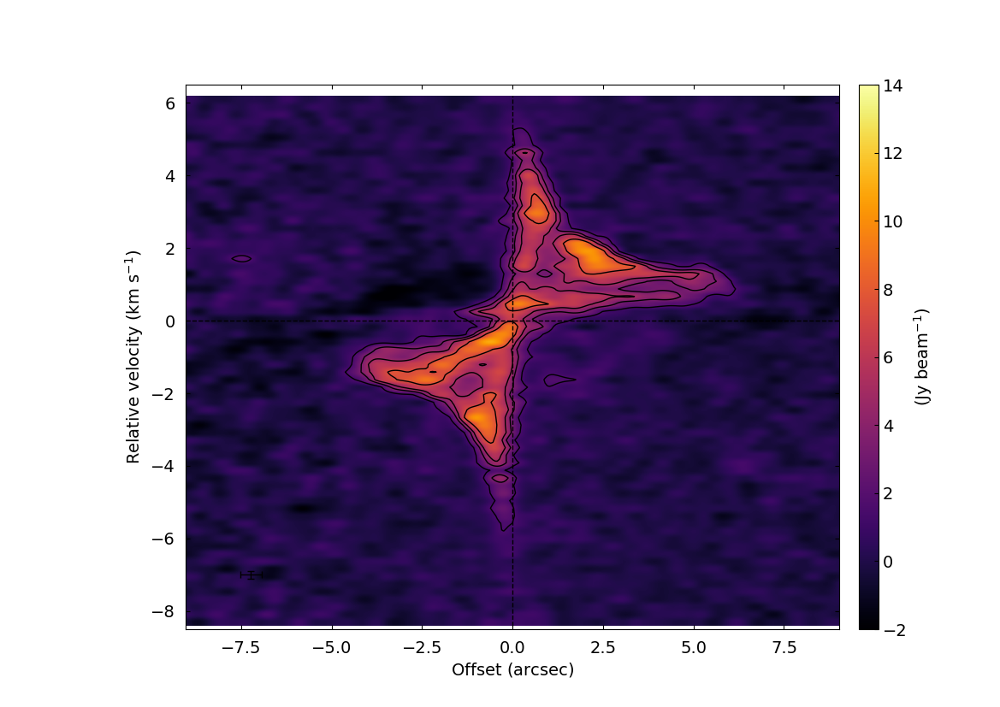

In [8]:
pv_dia6 = pv_b6.plot_pv(plot_curve=True)
pv_dia6[0].plot(r_rs_func/140.,v_rs_func,color = 'lime', alpha = 0.5)
pv_dia6[0].plot(r_bs_func/140.,v_bs_func,color = 'lime', alpha = 0.5)
pv_dia7 = pv_b7.plot_pv(plot_curve=True)

#### T estimation loop (fix V)

In [10]:
# Initiate LTE model
lte_model = LTEAnalysis()
lte_model.read_lamda_moldata('c18o')

estimating for r = -1.093e-01 arcsec, v = -8.18 Kmps , Tb7 = 0.4, Tb6 = 0.9


  0%|          | 0/10000 [00:00<?, ?it/s]

100%|██████████| 10000/10000 [00:27<00:00, 359.96it/s]


estimating for r = -1.151e-01 arcsec, v = -7.97 Kmps , Tb7 = 0.3, Tb6 = 0.5


100%|██████████| 10000/10000 [00:27<00:00, 360.14it/s]


estimating for r = -1.214e-01 arcsec, v = -7.76 Kmps , Tb7 = -0.0, Tb6 = 0.0


100%|██████████| 10000/10000 [00:27<00:00, 362.76it/s]


estimating for r = -1.281e-01 arcsec, v = -7.55 Kmps , Tb7 = 1.0, Tb6 = 0.2


100%|██████████| 10000/10000 [00:27<00:00, 361.47it/s]


estimating for r = -1.355e-01 arcsec, v = -7.35 Kmps , Tb7 = 1.6, Tb6 = 1.3


100%|██████████| 10000/10000 [00:28<00:00, 355.52it/s]


estimating for r = -1.435e-01 arcsec, v = -7.14 Kmps , Tb7 = 1.3, Tb6 = 0.4


100%|██████████| 10000/10000 [00:27<00:00, 360.06it/s]


estimating for r = -1.523e-01 arcsec, v = -6.93 Kmps , Tb7 = 1.3, Tb6 = 1.0


100%|██████████| 10000/10000 [00:27<00:00, 365.51it/s]


estimating for r = -1.619e-01 arcsec, v = -6.72 Kmps , Tb7 = 0.4, Tb6 = 0.5


100%|██████████| 10000/10000 [00:27<00:00, 369.29it/s]


estimating for r = -1.724e-01 arcsec, v = -6.51 Kmps , Tb7 = 0.1, Tb6 = 0.3


100%|██████████| 10000/10000 [00:27<00:00, 367.82it/s]


estimating for r = -1.840e-01 arcsec, v = -6.30 Kmps , Tb7 = 0.7, Tb6 = 1.2


100%|██████████| 10000/10000 [00:26<00:00, 372.85it/s]


estimating for r = -1.968e-01 arcsec, v = -6.10 Kmps , Tb7 = 1.9, Tb6 = 1.2


100%|██████████| 10000/10000 [00:27<00:00, 358.80it/s]


estimating for r = -2.110e-01 arcsec, v = -5.89 Kmps , Tb7 = 1.8, Tb6 = 1.1


100%|██████████| 10000/10000 [00:27<00:00, 357.97it/s]


estimating for r = -2.267e-01 arcsec, v = -5.68 Kmps , Tb7 = 2.6, Tb6 = 1.5


100%|██████████| 10000/10000 [01:07<00:00, 147.88it/s]


estimating for r = -2.443e-01 arcsec, v = -5.47 Kmps , Tb7 = 1.9, Tb6 = 1.6


100%|██████████| 10000/10000 [01:12<00:00, 137.95it/s]


estimating for r = -2.641e-01 arcsec, v = -5.26 Kmps , Tb7 = 2.6, Tb6 = 2.1


100%|██████████| 10000/10000 [00:28<00:00, 345.61it/s]


estimating for r = -2.863e-01 arcsec, v = -5.05 Kmps , Tb7 = 3.5, Tb6 = 2.5


100%|██████████| 10000/10000 [00:29<00:00, 340.39it/s]


estimating for r = -3.114e-01 arcsec, v = -4.85 Kmps , Tb7 = 3.0, Tb6 = 1.9


100%|██████████| 10000/10000 [00:29<00:00, 337.79it/s]


estimating for r = -3.400e-01 arcsec, v = -4.64 Kmps , Tb7 = 3.6, Tb6 = 2.9


100%|██████████| 10000/10000 [00:28<00:00, 347.16it/s]


estimating for r = -3.728e-01 arcsec, v = -4.43 Kmps , Tb7 = 4.3, Tb6 = 2.5


100%|██████████| 10000/10000 [00:44<00:00, 222.92it/s]
d:\L1489_IRS_ssp\LTEAnalysis\Tb_estimator.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(3, figsize=(10, 7), sharex=True)
C:\Users\mihirkumar\AppData\Local\Temp\ipykernel_18992\1573664514.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig1 = plt.figure(figsize=(10,10))


estimating for r = -4.105e-01 arcsec, v = -4.22 Kmps , Tb7 = 4.5, Tb6 = 4.4


100%|██████████| 10000/10000 [00:30<00:00, 330.23it/s]


estimating for r = -4.542e-01 arcsec, v = -4.01 Kmps , Tb7 = 5.9, Tb6 = 1.8


100%|██████████| 10000/10000 [00:31<00:00, 318.80it/s]


estimating for r = -5.053e-01 arcsec, v = -3.80 Kmps , Tb7 = 5.5, Tb6 = 4.6


100%|██████████| 10000/10000 [00:44<00:00, 226.09it/s]


estimating for r = -5.656e-01 arcsec, v = -3.60 Kmps , Tb7 = 7.5, Tb6 = 5.6


100%|██████████| 10000/10000 [00:31<00:00, 321.12it/s]


estimating for r = -6.373e-01 arcsec, v = -3.39 Kmps , Tb7 = 9.2, Tb6 = 6.4


100%|██████████| 10000/10000 [00:31<00:00, 314.63it/s]


estimating for r = -7.235e-01 arcsec, v = -3.18 Kmps , Tb7 = 8.9, Tb6 = 7.4


100%|██████████| 10000/10000 [00:32<00:00, 310.94it/s]


estimating for r = -8.286e-01 arcsec, v = -2.97 Kmps , Tb7 = 8.8, Tb6 = 7.8


100%|██████████| 10000/10000 [00:38<00:00, 258.27it/s]


estimating for r = -9.582e-01 arcsec, v = -2.76 Kmps , Tb7 = 10.1, Tb6 = 8.6


100%|██████████| 10000/10000 [00:32<00:00, 310.23it/s]


estimating for r = -1.121e+00 arcsec, v = -2.55 Kmps , Tb7 = 10.3, Tb6 = 9.8


100%|██████████| 10000/10000 [00:32<00:00, 309.10it/s]


estimating for r = -1.329e+00 arcsec, v = -2.35 Kmps , Tb7 = 10.0, Tb6 = 6.9


100%|██████████| 10000/10000 [00:32<00:00, 311.92it/s]


estimating for r = -1.601e+00 arcsec, v = -2.14 Kmps , Tb7 = 6.5, Tb6 = 5.2


100%|██████████| 10000/10000 [00:30<00:00, 324.62it/s]


estimating for r = -1.965e+00 arcsec, v = -1.93 Kmps , Tb7 = 6.5, Tb6 = 6.1


100%|██████████| 10000/10000 [00:31<00:00, 317.54it/s]


estimating for r = -2.469e+00 arcsec, v = -1.72 Kmps , Tb7 = 10.2, Tb6 = 6.5


100%|██████████| 10000/10000 [00:31<00:00, 313.17it/s]


estimating for r = -3.197e+00 arcsec, v = -1.51 Kmps , Tb7 = 10.4, Tb6 = 7.3


100%|██████████| 10000/10000 [00:32<00:00, 308.98it/s]


estimating for r = -4.299e+00 arcsec, v = -1.30 Kmps , Tb7 = 3.3, Tb6 = 2.6


100%|██████████| 10000/10000 [00:57<00:00, 174.54it/s]


estimating for r = -6.089e+00 arcsec, v = -1.10 Kmps , Tb7 = -0.6, Tb6 = -0.6


100%|██████████| 10000/10000 [01:15<00:00, 131.75it/s]


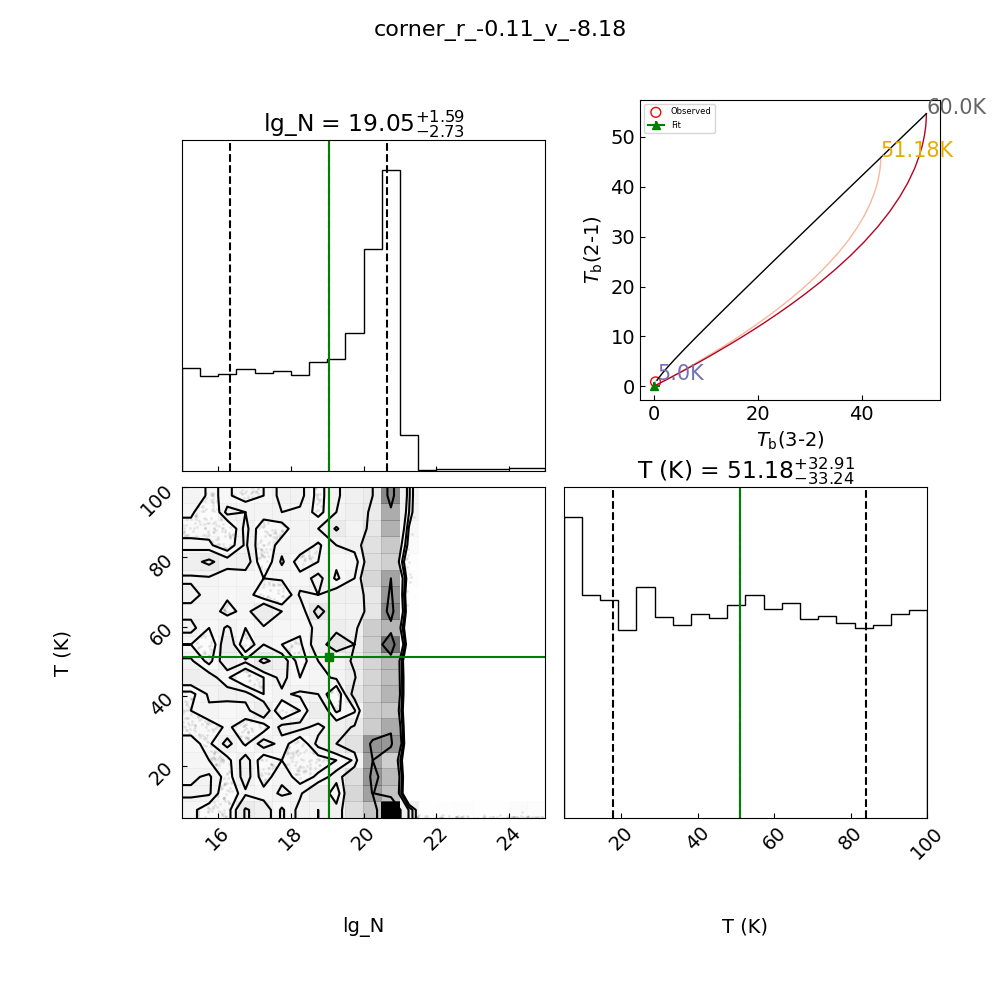

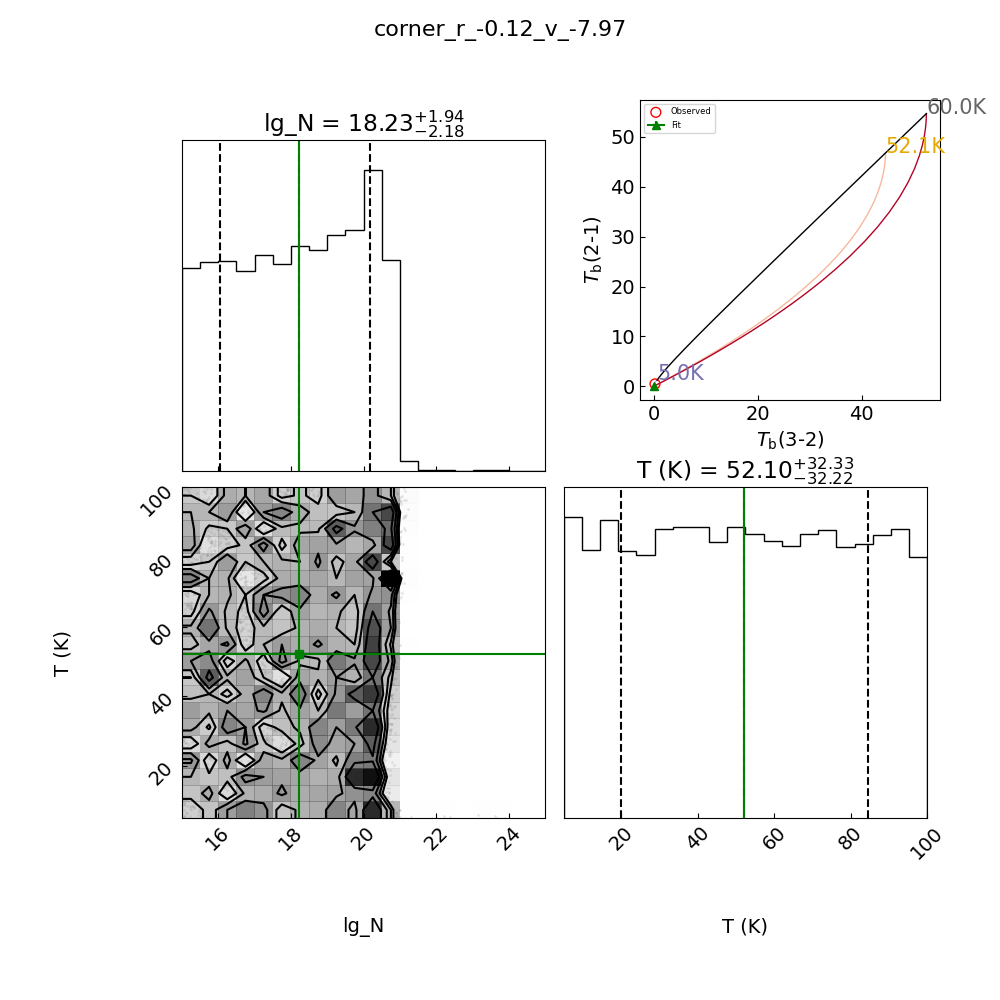

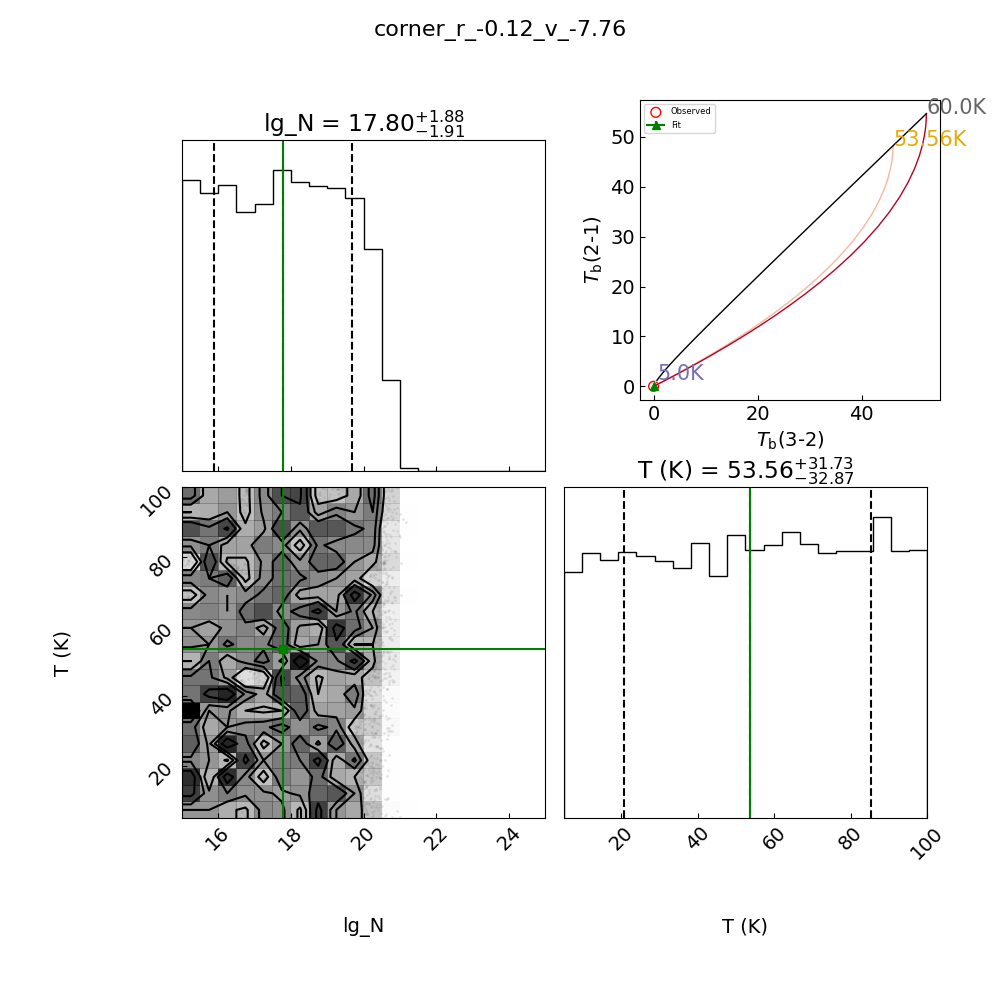

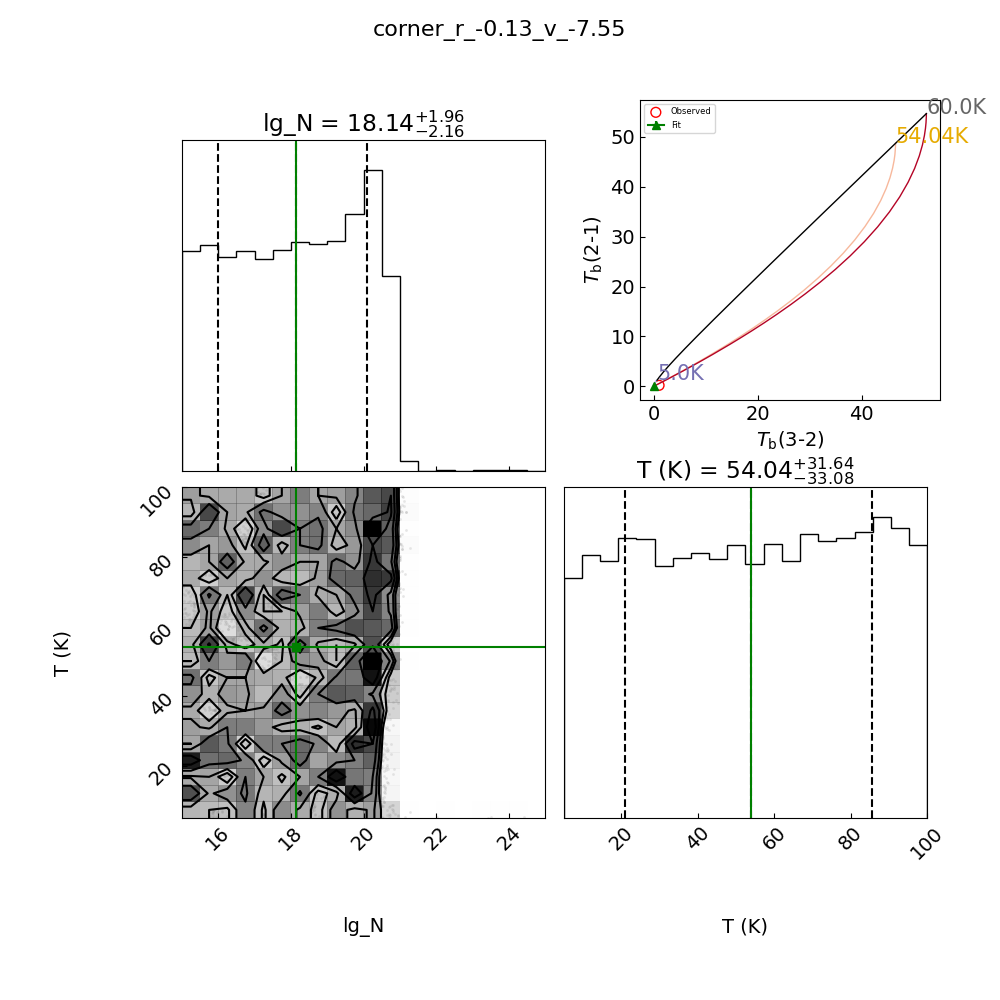

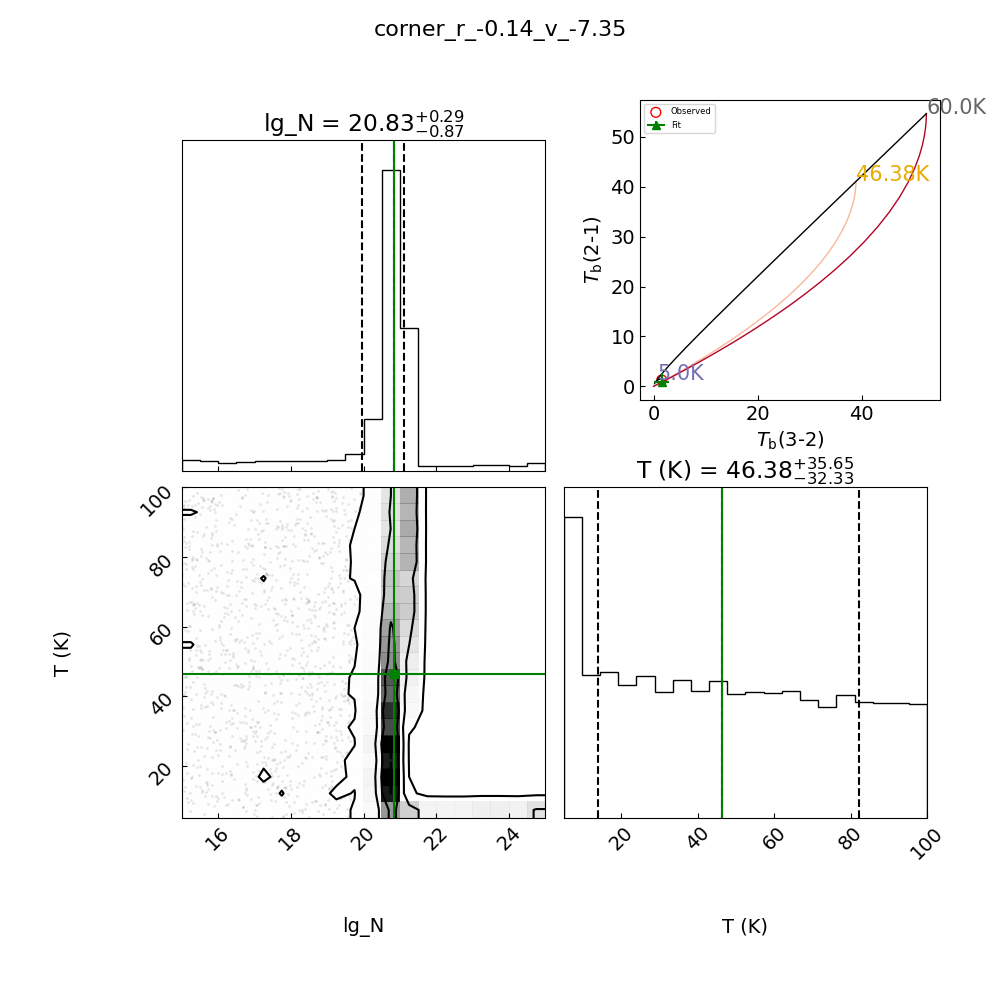

...

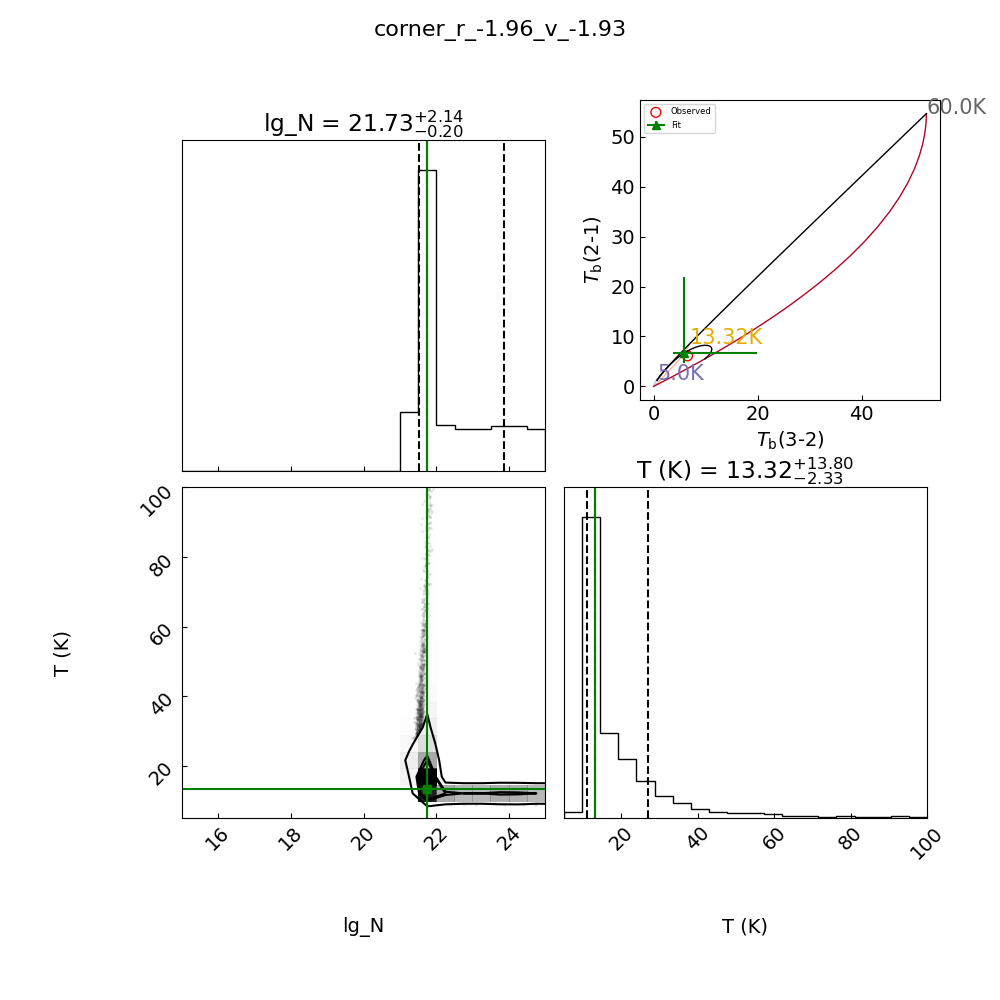

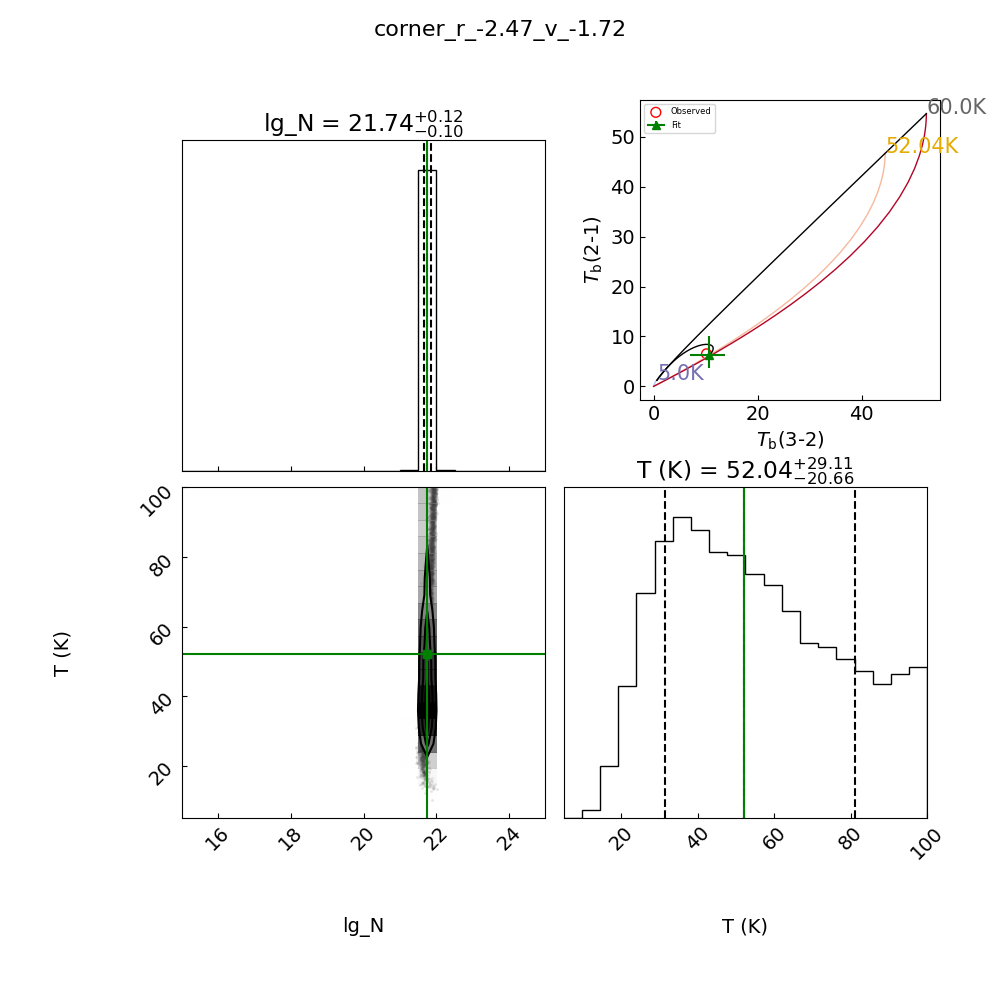

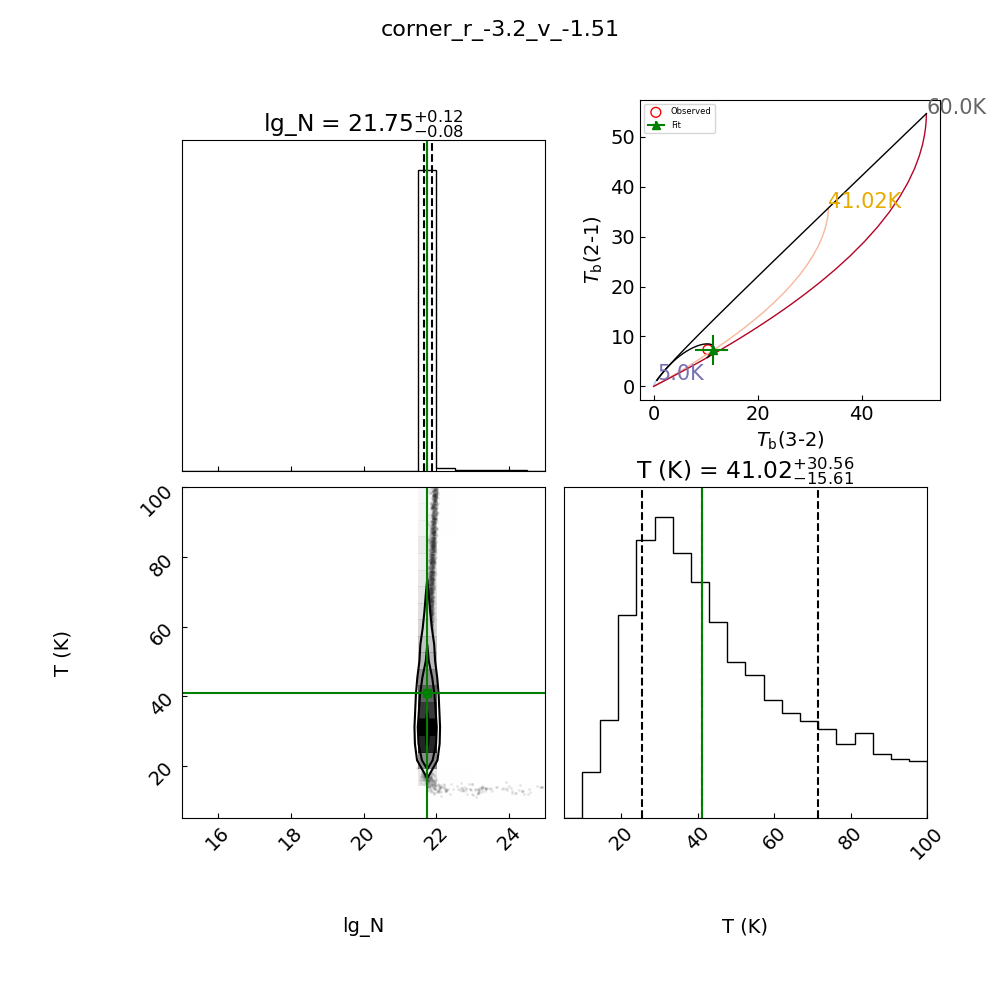

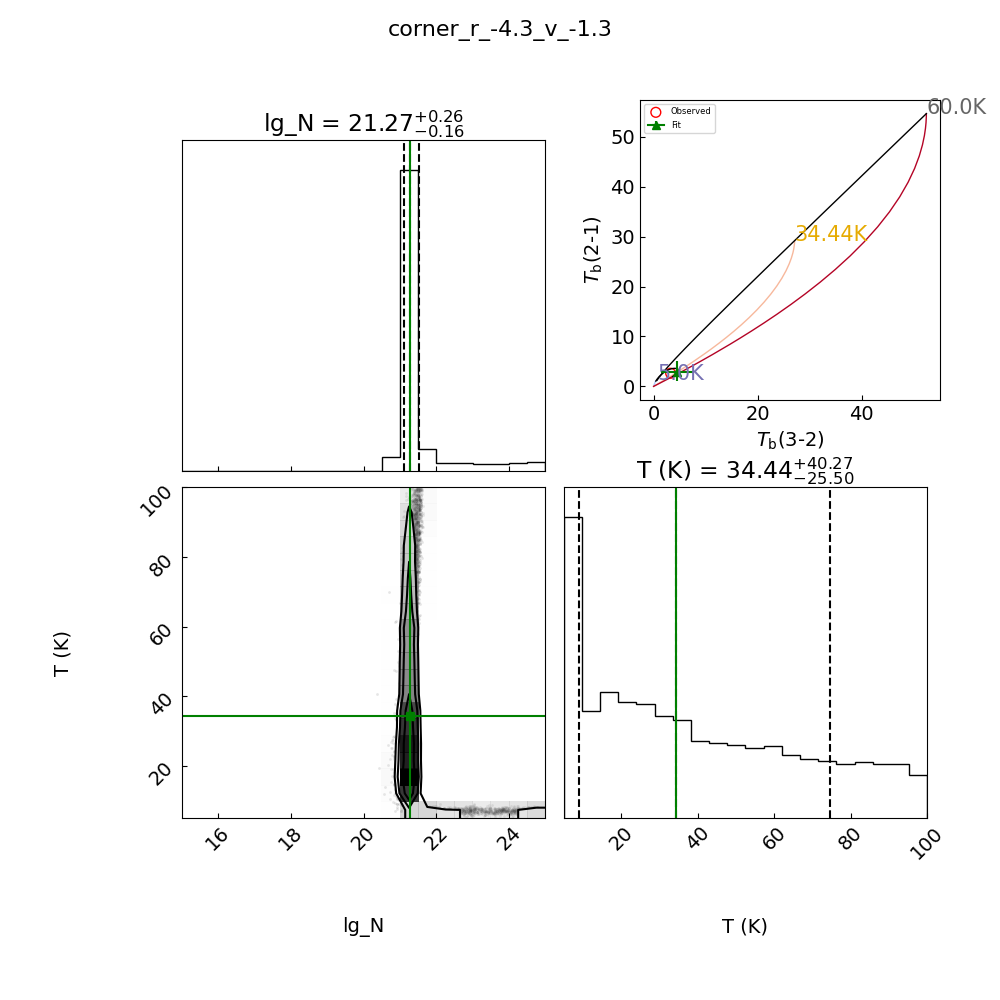

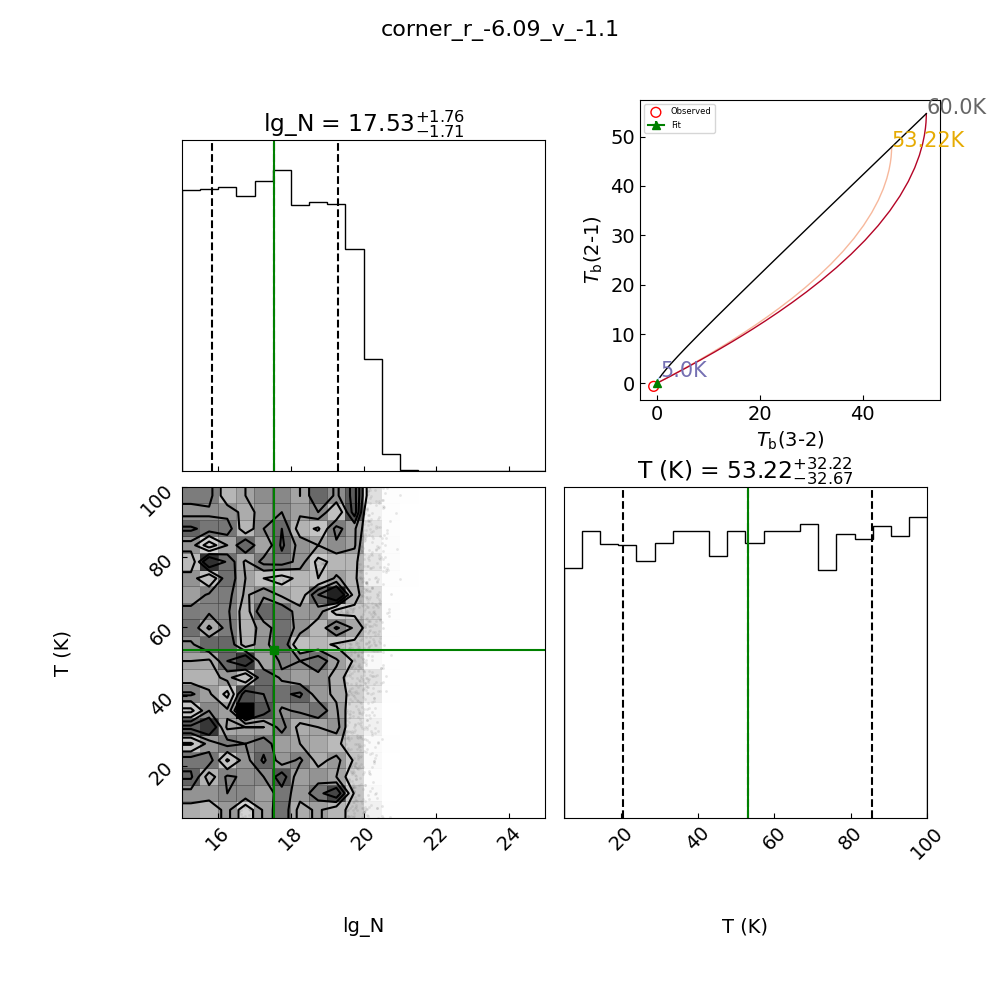

In [11]:
Texe_bs_empkep = []
Texe_upq_empkep = []
Texe_lq_empkep = []

Ncol_bs_empkep = []
Ncol_upq_empkep = []
Ncol_lq_empkep = []

plot_corner = True

np.random.seed(41)

N_conv_fraction = 1.e-7
lg_n_bounds = [15.,25.]
T_bounds = [5.,65.]
lg_n_init = np.random.uniform(lg_n_bounds[0], lg_n_bounds[-1])
T_init = np.random.uniform(T_bounds[0], T_bounds[-1])

op_dir_label = "blueshifted_points_empkep"

ctr = 0

for Tb7, Tb6, r, v in zip(Tb_df_b7["Tb_on_point_bs"], Tb_df_b6["Tb_on_point_bs"], 
                          pv_b6.r_as_bs, pv_b6.v_rot_blueshifted):

    print(f"estimating for r = {r:.3e} arcsec, v = {v: .2f} Kmps , Tb7 = {Tb7:.1f}, Tb6 = {Tb6:.1f}")

    flat_samples, autocorr = tb_est.estimate_params(t1 = Tb7, t2=Tb6, 
                                                    s1=np.sqrt((0.1*Tb7)**2 + 1.08**2), 
                                                    s2=np.sqrt((0.1*Tb6)**2 + 0.49**2), 
                                     estimator='mcmc', initial_params = [lg_n_init, T_init], 
                                     bounds=(lg_n_bounds[0], lg_n_bounds[-1], T_bounds[0], T_bounds[-1]), 
                                     initial_scatter = 0.1, args= None,
                                     nwalkers = 50, n_steps = 10000, burn_in = 2000, thin_by = 50, return_flat= True,
                                     intensity_model = lte_model, plot_chain = True, 
                                     r_v_info = [str(round(r,3)), str(round(v,2))], 
                                     chain_plot_path = os.path.join(os.path.abspath(os.getcwd()),"chains",op_dir_label),
                                     show_chains = False)
    
    flat_samples_N = flat_samples[:, 0]
    flat_samples_T = flat_samples[:, 1]
    
    T_qtls = np.quantile(flat_samples_T,[0.16,0.5,0.84])
    Texe_lq_empkep.append(T_qtls[0])
    Texe_bs_empkep.append(T_qtls[1])
    Texe_upq_empkep.append(T_qtls[2])

    Ncol_qtls = np.quantile(flat_samples_N,[0.16,0.5,0.84])
    Ncol_qtls = (10**Ncol_qtls)
    Ncol_lq_empkep.append(Ncol_qtls[0])
    Ncol_bs_empkep.append(Ncol_qtls[1])
    Ncol_upq_empkep.append(Ncol_qtls[2])

    if plot_corner:

        fig1 = plt.figure(figsize=(10,10))
        #print(np.shape(axes1))

        fig1 = corner.corner(flat_samples, labels= ["lg_N", "T (K)"], 
                                truths=[np.log10(Ncol_qtls[1]), T_qtls[1]], 
                            truth_color = 'green', quantiles=[0.16,0.5,0.84], 
                            show_titles=True, fig = fig1, range=(lg_n_bounds, T_bounds))



        ax = fig1.add_axes(rect = [0.45,0.6,0.68,0.3])
        fig_lt,ax_lt = get_lte_grid(model=lte_model, Ncol=Ncol_qtls, 
                                Texe= T_qtls, tb7=Tb7, tb6=Tb6, figure = fig1,
                                axes = ax)
                            
        fig1.suptitle('corner_r_'+str(round(r,2))+'_v_'+str(round(v,2)), fontsize=16)
        fig1.subplots_adjust(top=0.86)
        figname = str(ctr) + '_corner_r_'+str(round(r,2))+'_v_'+str(round(v,2))+'.jpg'
        dir_path = os.path.join(os.path.abspath(os.getcwd()),"corner_plots",
                                op_dir_label)
        
        if not os.path.isdir(dir_path):
            os.mkdir(dir_path)
        figpath = os.path.join(dir_path, figname)

        #plt.show()
        fig1.savefig(fname = figpath, dpi=300, format='jpeg')
        #plt.close()

    ctr = ctr+1


In [12]:
# Calculate errorbars

T_err_empkep_bs = [np.array(Texe_bs_empkep)-np.array(Texe_lq_empkep),np.array(Texe_upq_empkep)-np.array(Texe_bs_empkep)] #[tl,tu] for tl,tu in zip(

N_err_empkep_bs = [np.array(Ncol_bs_empkep)-np.array(Ncol_lq_empkep), np.array(Ncol_upq_empkep)-np.array(Ncol_bs_empkep)]

In [13]:
results_data = {"r_empkep_bs": pv_b6.r_as_bs,
        "Tb7_empkep_bs" : Tb_df_b7["Tb_on_point_bs"], "Tb6_empkep_bs" : Tb_df_b6["Tb_on_point_bs"],
        "Texe_bs_empkep" : Texe_bs_empkep, "Texe_err_bs_empkep" : np.array(T_err_empkep_bs).T.tolist(),
        "Ncol_bs_empkep" : Ncol_bs_empkep, "Ncol_err_bs_empkep" : np.array(N_err_empkep_bs).T.tolist()
        }
results_df = pd.DataFrame(data = results_data)

respath = os.path.join(os.path.abspath(os.getcwd()), res_prefix+".csv")
results_df.to_csv(path_or_buf= os.path.join(os.path.abspath(os.getcwd()), res_prefix+".csv"))

#### Visualize results

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


35 35


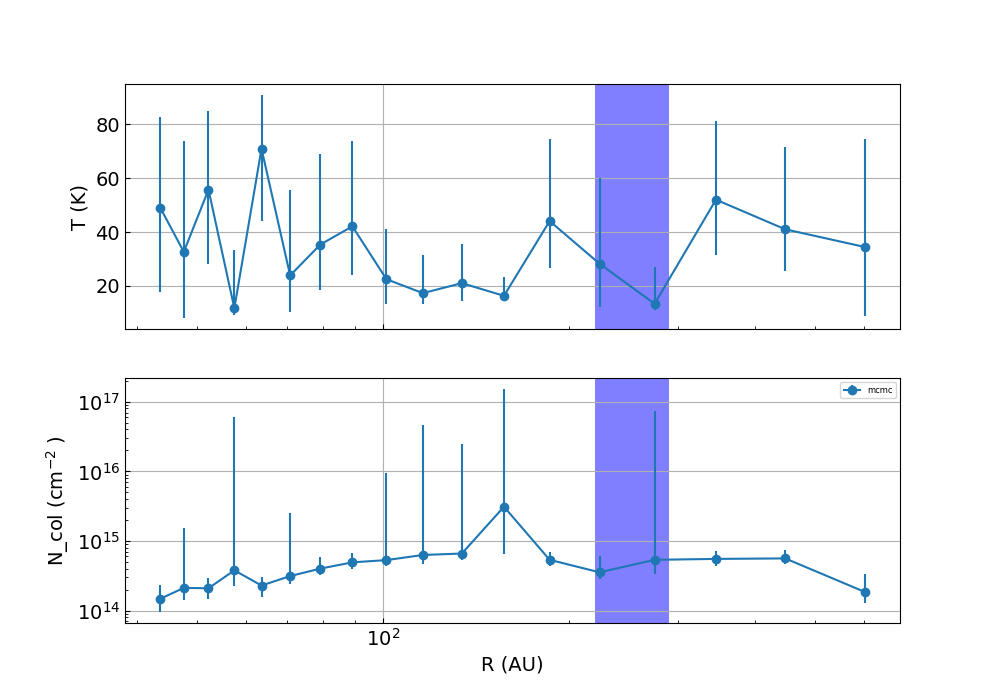

In [14]:
vis_results_fig, axes = plt.subplots(2, figsize=(10, 7), sharex=True)

acceptable_r_range = [ -5.0, -0.3]
ftd_r_as_bs, ftd_Texe_bs_empkep, ftd_Terr_bs_empkep = zip(*[(r, t, terr) for r, t, terr in 
                                                         zip(pv_b6.r_as_bs, Texe_bs_empkep, np.array(T_err_empkep_bs).T.tolist()) 
                                                         if acceptable_r_range[0] <= r <= acceptable_r_range[-1]])

# print(len(pv_b6.r_as_bs*140.), len(Texe_bs_empkep))
axes[0].errorbar(-np.array(ftd_r_as_bs)*140., ftd_Texe_bs_empkep, yerr=np.array(ftd_Terr_bs_empkep).T, marker='o', label = 'mcmc')
axes[0].axvspan(xmin = 220, xmax=290, facecolor='b', alpha=0.5)
#axes[0].set_xlim(10, 800)
#axes[0].set_ylim(0,50)
axes[0].set_ylabel(r"T (K)")
axes[0].grid(True)
axes[1].legend(prop={'size': 6})

ftd_r_as_bs, ftd_Ncol_bs_empkep, ftd_N_err_bs_empkep = zip(*[(r, t, terr) for r, t, terr in 
                                                         zip(pv_b6.r_as_bs, Ncol_bs_empkep, np.array(N_err_empkep_bs).T.tolist()) 
                                                         if acceptable_r_range[0] <= r <= acceptable_r_range[-1]])

axes[1].errorbar(-np.array(ftd_r_as_bs)*140., np.array(ftd_Ncol_bs_empkep)*N_conv_fraction, 
                 yerr=np.array(ftd_N_err_bs_empkep).T*N_conv_fraction, marker='o', label = 'mcmc')
axes[1].axvspan(xmin = 220, xmax=290, facecolor='b', alpha=0.5)
axes[1].set_ylabel(r"N_col (cm$^{-2}$ )")
axes[1].set_xscale('log')
axes[1].set_yscale('log')
axes[1].grid(True)
axes[1].legend(prop={'size': 6})
axes[1].set_xlabel("R (AU)")

vis_results_fig.suptitle("empkep_bs")

vis_results_figname =  'N_vs_r_T_vs_r.jpg'
dir_path = os.path.join(os.path.abspath(os.getcwd()),"vis_results",
                        op_dir_label)

plt.show()

if not os.path.isdir(dir_path):
    os.mkdir(dir_path)
vis_results_figpath = os.path.join(dir_path, vis_results_figname)
vis_results_fig.savefig(fname = vis_results_figpath, dpi=300, format='jpeg')

### Temperature estimation (fix r)

#### Read the Data

In [15]:
# Read b7 data
pv_b7 = pv_analyze(pv_path='uid___A002_Xb5ee5a_X288a.ms.split.cal.l1489irs.spw3.cvel_chavg2.cube.clean_2_6_8_05.image.pbcor.regridded.smoothened.PV_69_w1.fits',
                    is_Tb=True, v_sys=7.33)  #7.33 7.22
pv_b7.read_pv(print_details = True)


# Read band 6 data
pv_b6 = pv_analyze(pv_path='uid___A002_b_6.cal.l1489_irs.spw_1_7.line.cube.clean.c_baseline_0.image.pbcor.Regridded.Smoothened.PV_69_w1.fits',
                    is_Tb=True, v_sys=7.33) #7.33 7.22
pv_b6.read_pv(print_details = True)



Convert frequency to velocity
 rms = 3.45e-02 Jy beam$^-1$
 rms = 1.08 K
Convert frequency to velocity
 rms = 6.92e-03 Jy beam$^-1$
 rms = 0.49 K


In [21]:
# define fix r points
# Get equidistance points

r_au_empkep_rs_fix_r = np.arange(start=42., step=42., stop=840.)
r_au_empkep_bs_fix_r = -r_au_empkep_rs_fix_r

v_100 = 2.842 #kmps # idpft-2.674 # JS- 3.2 # newft 2.842

v_rot_empkep_rs_fix_r =  emp_kep_r(r=r_au_empkep_rs_fix_r, r_b=100., v_100=v_100)
v_rot_empkep_bs_fix_r = - v_rot_empkep_rs_fix_r

plot_points = [r_au_empkep_rs_fix_r, v_rot_empkep_rs_fix_r, r_au_empkep_bs_fix_r, v_rot_empkep_bs_fix_r]

In [22]:
# Evaluate empirical keplerian curve function
r_rs_func = np.arange(start=1., step=0.5, stop=840.)   # Note that this is in AU
v_rs_func = emp_kep_r(r=r_rs_func, r_b=100., v_100=v_100)

r_bs_func = -r_rs_func
v_bs_func = -v_rs_func

In [23]:
Tb_df_b7 = pv_b7.get_tb_on_curve(curve_function = plot_points, 
                                get_surrounding_pix = False, mode='vals',
                                num_pix = 3)
Tb_df_b6 = pv_b6.get_tb_on_curve(curve_function = plot_points, 
                                    get_surrounding_pix = False, mode='vals',
                                    num_pix = 3)

#### Data Visualization

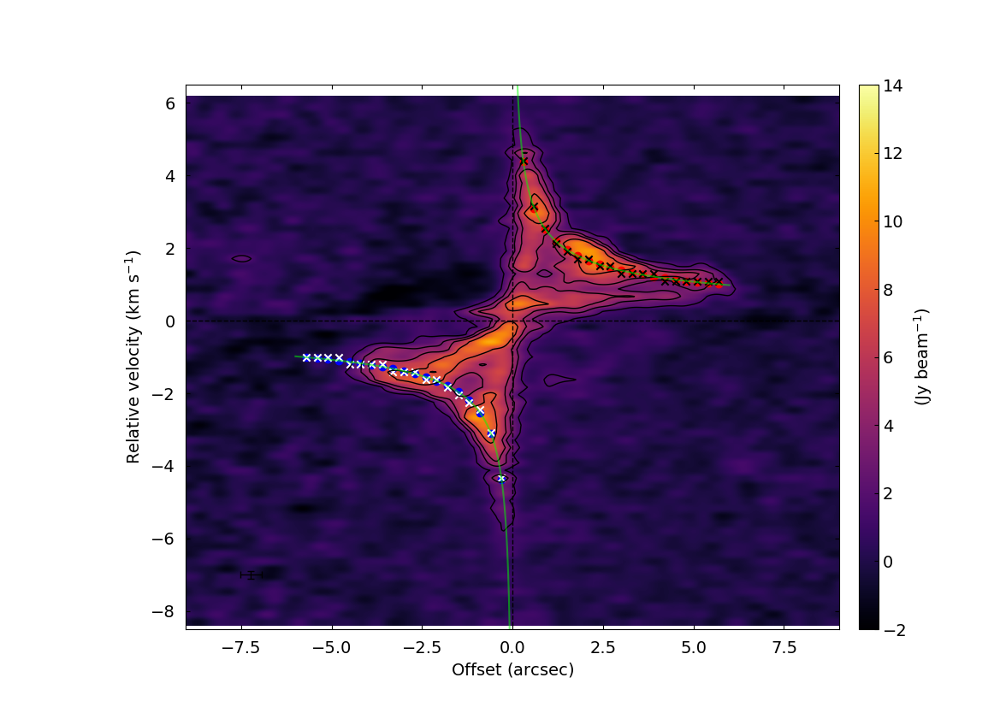

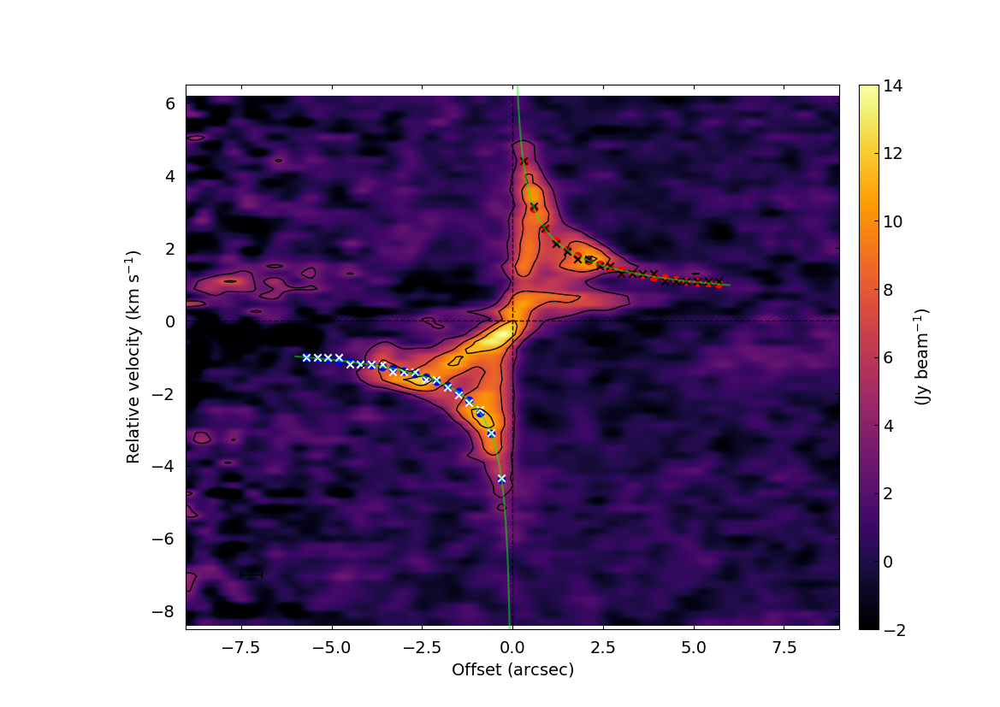

In [24]:

pv_dia6 = pv_b6.plot_pv(plot_curve=True)
pv_dia6[0].plot(r_rs_func/140.,v_rs_func,color = 'lime', alpha = 0.5)
pv_dia6[0].plot(r_bs_func/140.,v_bs_func,color = 'lime', alpha = 0.5)

pv_dia7 = pv_b7.plot_pv(plot_curve=True)
pv_dia7[0].plot(r_rs_func/140.,v_rs_func,color = 'lime', alpha = 0.5)
pv_dia7[0].plot(r_bs_func/140.,v_bs_func,color = 'lime', alpha = 0.5)

#### Loop over points for T estimation

In [25]:
# Initiate LTE model
lte_model = LTEAnalysis()
lte_model.read_lamda_moldata('c18o')

In [26]:
op_dir_label = "bs_empkep_fixr_results_rms_newcurve_lwerN_bnds"

Texe_bs_empkep_fix_r = []
Texe_upq_empkep_fix_r = []
Texe_lq_empkep_fix_r = []

Ncol_bs_empkep_fix_r = []
Ncol_upq_empkep_fix_r = []
Ncol_lq_empkep_fix_r = []

plot_corner = True

np.random.seed(41)

N_conv_fraction = 1.
lg_n_bounds = [10.,15.2]
T_bounds = [5.,65.]
lg_n_init = np.random.uniform(lg_n_bounds[0], lg_n_bounds[-1])
T_init = np.random.uniform(T_bounds[0], T_bounds[-1])



ctr = 0

for Tb7, Tb6, r, v in zip(Tb_df_b7["Tb_on_point_bs"], Tb_df_b6["Tb_on_point_bs"], 
                          pv_b6.r_as_bs, pv_b6.v_rot_blueshifted):

    print(f"estimating for r = {r:.3e} arcsec, v = {v: .2f} Kmps , Tb7 = {Tb7:.1f}, Tb6 = {Tb6:.1f}")

    flat_samples, autocorr = tb_est.estimate_params(t1 = Tb7, t2=Tb6, 
                                                    s1=np.sqrt( 1.08**2 ), # + 1.08**2 + (0.1*Tb7)**2
                                                    s2=np.sqrt( 0.49**2), #  (0.1*Tb6)**2 + 0.49**2
                                     estimator='mcmc', like_function = 'chisq', initial_params = [lg_n_init, T_init], 
                                     bounds=(lg_n_bounds[0], lg_n_bounds[-1], T_bounds[0], T_bounds[-1]), 
                                     initial_scatter = 0.1, args= None,
                                     nwalkers = 50, n_steps = 9000, burn_in = 2000, thin_by = 50, return_flat= True,
                                     intensity_model = lte_model, plot_chain = True, 
                                     r_v_info = [str(round(r,3)), str(round(v,2))], 
                                     chain_plot_path = os.path.join(os.path.abspath(os.getcwd()),
                                                                    "chains",op_dir_label),
                                     show_chains = False)
    
    flat_samples_N = flat_samples[:, 0]
    flat_samples_T = flat_samples[:, 1]
    
    T_qtls = np.quantile(flat_samples_T,[0.16,0.5,0.84])
    Texe_lq_empkep_fix_r.append(T_qtls[0])
    Texe_bs_empkep_fix_r.append(T_qtls[1])
    Texe_upq_empkep_fix_r.append(T_qtls[2])

    Ncol_qtls = np.quantile(flat_samples_N,[0.16,0.5,0.84])
    Ncol_qtls = (10**Ncol_qtls)
    Ncol_lq_empkep_fix_r.append(Ncol_qtls[0])
    Ncol_bs_empkep_fix_r.append(Ncol_qtls[1])
    Ncol_upq_empkep_fix_r.append(Ncol_qtls[2])

    if plot_corner:

        fig1 = plt.figure(figsize=(10,10))
        #print(np.shape(axes1))

        fig1 = corner.corner(flat_samples, labels= ["lg_N", "T (K)"], 
                                truths=[np.log10(Ncol_qtls[1]), T_qtls[1]], 
                            truth_color = 'green', quantiles=[0.16,0.5,0.84], 
                            show_titles=True, fig = fig1, range=(lg_n_bounds, T_bounds))



        ax = fig1.add_axes(rect = [0.45,0.6,0.68,0.3])
        fig_lt,ax_lt, Tb_6_prediction, Tb_7_prediction = get_lte_grid(model=lte_model, Ncol=Ncol_qtls, 
                                Texe= T_qtls, tb7=Tb7, tb6=Tb6, figure = fig1,
                                axes = ax)
                            
        fig1.suptitle('corner_r_'+str(round(r,2))+'_v_'+str(round(v,2)) + '_Tb6_' + str(round(Tb6,1))+ '_Tb7_' + str(round(Tb7,1)), fontsize=16)
        fig1.subplots_adjust(top=0.86)
        figname = str(ctr) + '_corner_r_'+str(round(r,2))+'_v_'+str(round(v,2))+'.jpg'
        dir_path = os.path.join(os.path.abspath(os.getcwd()),"corner_plots",
                                op_dir_label)
        
        if not os.path.isdir(dir_path):
            os.mkdir(dir_path)
        figpath = os.path.join(dir_path, figname)

        #plt.show()
        fig1.savefig(fname = figpath, dpi=300, format='jpeg')
        plt.close()

    ctr = ctr+1


estimating for r = -3.000e-01 arcsec, v = -4.39 Kmps , Tb7 = 4.5, Tb6 = 4.5


100%|██████████| 9000/9000 [09:14<00:00, 16.24it/s]


dtauv_dT =  3.233599463648773e-05
dtauv_dT =  1.4481146981136266e-05
Tb7_dIv_dN = 1.69e-14, Tb6_dIv_dN = 1.63e-14
Tb7_dIv_dT = 0.32, Tb6_dIv_dT = 0.27
Ncols and lgNcols up 3.19e+14, lgNc = 1.45e+01
Ncols and lgNcols med 2.47e+14, lgNc = 1.44e+01
Ncols and lgNcols dwn 2.12e+14, lgNc = 1.43e+01
del T -> + 14.18, - 9.02
del N -> + 7.15e+13, - 3.50e+13
[[2.86045791 4.49839856]]
[[2.39874751 3.77230593]]
estimating for r = -6.000e-01 arcsec, v = -3.10 Kmps , Tb7 = 9.7, Tb6 = 8.2


100%|██████████| 9000/9000 [09:22<00:00, 16.01it/s]


dtauv_dT =  2.0560403845131354e-05
dtauv_dT =  7.894226949480624e-06
Tb7_dIv_dN = 1.44e-14, Tb6_dIv_dN = 1.33e-14
Tb7_dIv_dT = 0.45, Tb6_dIv_dT = 0.35
Ncols and lgNcols up 5.48e+14, lgNc = 1.47e+01
Ncols and lgNcols med 5.03e+14, lgNc = 1.47e+01
Ncols and lgNcols dwn 4.65e+14, lgNc = 1.47e+01
del T -> + 8.38, - 6.28
del N -> + 4.46e+13, - 3.81e+13
[[2.85388675 3.80629068]]
[[2.19670907 2.92979855]]
estimating for r = -9.000e-01 arcsec, v = -2.53 Kmps , Tb7 = 10.9, Tb6 = 8.5


100%|██████████| 9000/9000 [09:38<00:00, 15.55it/s]


KeyboardInterrupt: 

In [17]:
# Calculate errorbars

T_err_empkep_bs_fix_r = [np.array(Texe_bs_empkep_fix_r)-np.array(Texe_lq_empkep_fix_r),
                         np.array(Texe_upq_empkep_fix_r)-np.array(Texe_bs_empkep_fix_r)] 

N_err_empkep_bs_fix_r = [np.array(Ncol_bs_empkep_fix_r)-np.array(Ncol_lq_empkep_fix_r), 
                         np.array(Ncol_upq_empkep_fix_r)-np.array(Ncol_bs_empkep_fix_r)]

In [18]:
results_data_fix_r = {"r_empkep_bs_fix_r": pv_b6.r_as_bs,
        "Tb7_empkep_bs_fix_r" : Tb_df_b7["Tb_on_point_bs"], "Tb6_empkep_bs_fix_r" : Tb_df_b6["Tb_on_point_bs"],
        "Texe_bs_empkep_fix_r" : Texe_bs_empkep_fix_r, "Texe_err_bs_empkep_fix_r" : np.array(T_err_empkep_bs_fix_r).T.tolist(),
        "Ncol_bs_empkep_fix_r" : Ncol_bs_empkep_fix_r, "Ncol_err_bs_empkep_fix_r" : np.array(N_err_empkep_bs_fix_r).T.tolist()
        }
results_df_fix_r = pd.DataFrame(data = results_data_fix_r)

res_path = os.path.join(os.path.abspath(os.getcwd()), res_prefix+".csv")

if not os.path.exists(res_path):

        df = pd.DataFrame(results_df_fix_r)
        df.to_csv(res_path, index=False)

existing_results = pd.read_csv(res_path)

updated_results = pd.concat([existing_results, results_df_fix_r], axis=1)

updated_results.to_csv(path_or_buf= res_path)

#### Visualize results

19 19


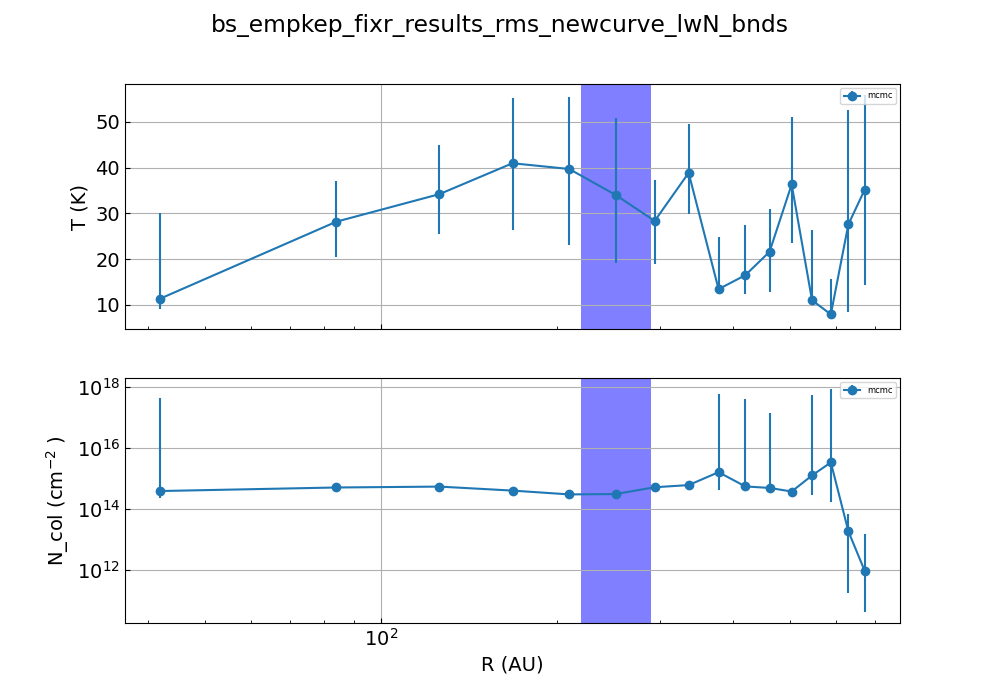

In [19]:
N_conv_fraction = 1.
vis_results_fig, axes = plt.subplots(2, figsize=(10, 7), sharex=True)

acceptable_r_range = [-5.0, -0.3]
ftd_r_as_bs_fix_r, ftd_Texe_bs_empkep_fix_r, ftd_Terr_bs_empkep_fix_r = zip(*[(r, t, terr) for r, t, terr in 
                                                         zip(pv_b6.r_as_bs, Texe_bs_empkep_fix_r, np.array(T_err_empkep_bs_fix_r).T.tolist())
                                                         if acceptable_r_range[0] <= r <= acceptable_r_range[-1]])

print(len(pv_b6.r_as_bs*140.), len(Texe_bs_empkep_fix_r))
axes[0].errorbar(-np.array(ftd_r_as_bs_fix_r)*140., ftd_Texe_bs_empkep_fix_r, 
                 yerr=np.array(ftd_Terr_bs_empkep_fix_r).T, marker='o', label = 'mcmc')

# axes[0].axvspan(xmin = 130, xmax=180, facecolor='r', alpha=0.5)
axes[0].axvspan(xmin = 220, xmax=290, facecolor='b', alpha=0.5)
#axes[0].set_xlim(10, 800)
#axes[0].set_ylim(0,50)
axes[0].set_ylabel(r"T (K)")
axes[0].grid(True)
axes[0].legend(prop={'size': 6})

ftd_r_as_bs_fix_r, ftd_Ncol_bs_empkep_fix_r, ftd_N_err_bs_empkep_fix_r = zip(*[(r, t, terr) for r, t, terr in 
                                                         zip(pv_b6.r_as_bs, Ncol_bs_empkep_fix_r, np.array(N_err_empkep_bs_fix_r).T.tolist()) 
                                                         if acceptable_r_range[0] <= r <= acceptable_r_range[-1]])


axes[1].errorbar(-np.array(ftd_r_as_bs_fix_r)*140., np.array(ftd_Ncol_bs_empkep_fix_r)*N_conv_fraction, 
                 yerr=np.array(ftd_N_err_bs_empkep_fix_r).T*N_conv_fraction, 
                 marker='o', label = 'mcmc')
#axes[1].axvspan(xmin = 130, xmax=180, facecolor='r', alpha=0.5)
axes[1].axvspan(xmin = 220, xmax=290, facecolor='b', alpha=0.5)
#axes[0].set_xlim(10, 800)
axes[1].set_ylabel(r"N_col (cm$^{-2}$ )")
axes[1].set_xscale('log')
axes[1].set_yscale('log')
axes[1].grid(True)
axes[1].legend(prop={'size': 6})
axes[1].set_xlabel("R (AU)")

vis_results_fig.suptitle(op_dir_label)

vis_results_figname =  'N_vs_r_T_vs_r.jpg'
dir_path = os.path.join(os.path.abspath(os.getcwd()),"vis_results",
                        op_dir_label)

if not os.path.isdir(dir_path):
    os.mkdir(dir_path)
vis_results_figpath = os.path.join(dir_path, vis_results_figname)
vis_results_fig.savefig(fname = vis_results_figpath, dpi=300, format='jpeg')